In [1]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import models, optimizers, layers, metrics
from greenMLAnalysis import *

2023-07-17 22:33:25.985095: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def architecture_1(input_shape, n_filters, filter_size):
    network = models.Sequential()
    network.add(layers.Input(shape=(*input_shape, 1)))
    #network.add(layers.RandomFlip())
    #network.add(layers.RandomBrightness(0.2, (0, 319)))
    #network.add(layers.RandomContrast(0.1))
    network.add(layers.Normalization())
    network.add(layers.Conv2D(n_filters[0], filter_size[0], strides=1, activation='relu', padding='same'))
    network.add(layers.BatchNormalization())
    network.add(layers.MaxPooling2D(pool_size=(2, 2), strides=2))
    network.add(layers.Conv2D(n_filters[1], filter_size[1], strides=1, activation='relu', padding='same'))
    network.add(layers.BatchNormalization())
    network.add(layers.Flatten())
    network.add(layers.Dense(2, activation='sigmoid'))
    return network

def architecture_3(input_shape, n_filters, filter_size):
    network = models.Sequential()
    network.add(layers.Input(shape=(*input_shape, 1)))
    network.add(layers.RandomFlip())
    network.add(layers.RandomRotation(1))
    network.add(layers.Normalization())
    network.add(layers.Conv2D(n_filters[0], filter_size[0], strides=1, activation='relu', padding='same'))
    network.add(layers.BatchNormalization())
    #network.add(layers.MaxPooling2D(pool_size=(2, 2)))
    network.add(layers.Conv2D(n_filters[1], filter_size[1], strides=1, activation='relu', padding='same'))
    network.add(layers.BatchNormalization())
    network.add(layers.Flatten())
    network.add(layers.Dense(n_filters[1], activation='sigmoid'))
    network.add(layers.BatchNormalization())
    network.add(layers.Dense(2, activation='sigmoid'))
    return network

In [3]:
path = "/Users/jackmango/Desktop/QUIRP - Work/Princeton/Data/06:23:23/imaging exposure time = 30ms/"
n_tweezers = 100
n_loops = 20

In [4]:
model = architecture_1((17, 17), [16, 8], [3, 3])
model.compile(optimizer=optimizers.Adam(learning_rate=1e-4), loss='binary_crossentropy',
               metrics=['binary_accuracy'])
model.save(path + 'model.h5')

In [5]:
analysis = greenMLAnalysis(n_tweezers, n_loops)

All brightness values for tweezer 16 are above the lower threshold!
No images for this tweezer can be labeled dark!


Epoch 1/8
37834/37834 [==============================] - 247s 7ms/step - loss: 0.0124 - binary_accuracy: 0.9967 - val_loss: 0.0015 - val_binary_accuracy: 0.9997
Epoch 2/8
37834/37834 [==============================] - 247s 7ms/step - loss: 0.0049 - binary_accuracy: 0.9991 - val_loss: 0.0012 - val_binary_accuracy: 0.9998
Epoch 3/8
37834/37834 [==============================] - 246s 6ms/step - loss: 0.0046 - binary_accuracy: 0.9992 - val_loss: 8.9766e-04 - val_binary_accuracy: 0.9999
Epoch 4/8
37834/37834 [==============================] - 266s 7ms/step - loss: 0.0045 - binary_accuracy: 0.9992 - val_loss: 6.2948e-04 - val_binary_accuracy: 0.9999
Epoch 5/8
37834/37834 [==============================] - 253s 7ms/step - loss: 0.0044 - binary_accuracy: 0.9992 - val_loss: 9.4785e-04 - val_binary_accuracy: 0.9998
Epoch 6/8
37834/37834 [==============================] - 258s 7ms/step - loss: 0.0043 - binary_accuracy: 0.9992 - val_loss: 6.1025e-04 - val_binary_accuracy: 0.9999
Epoch 7/8
37834/37

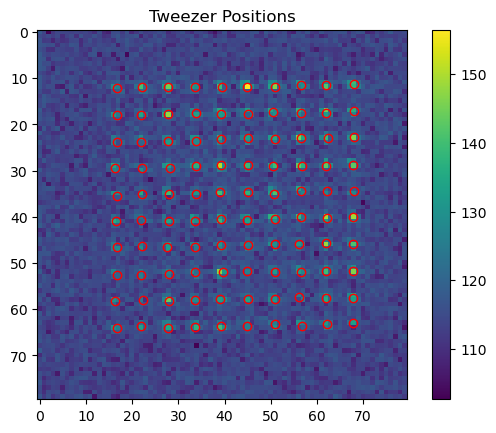

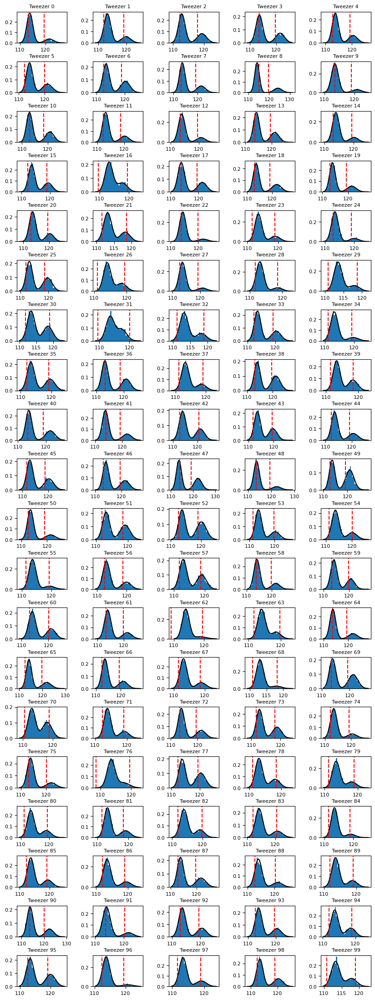

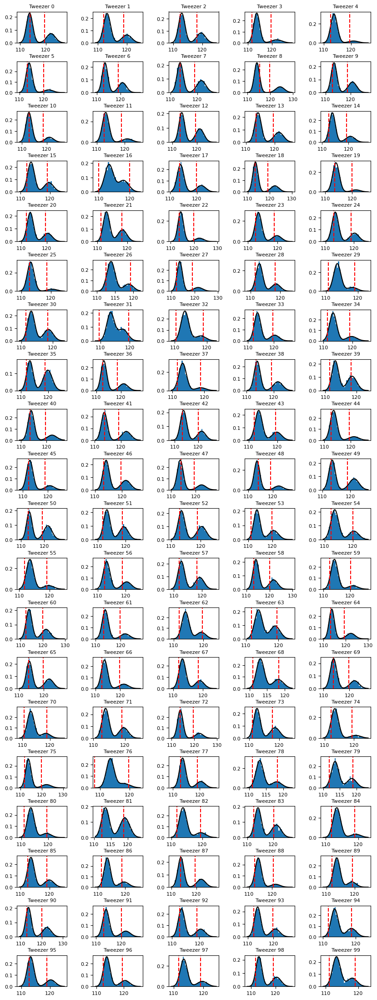

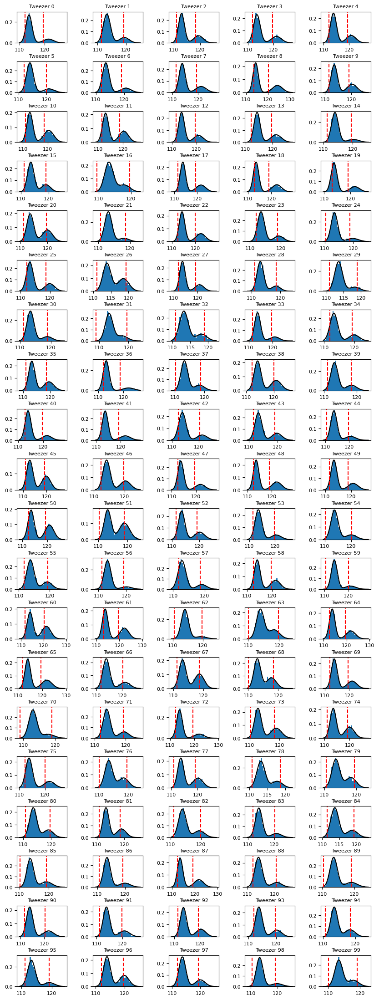

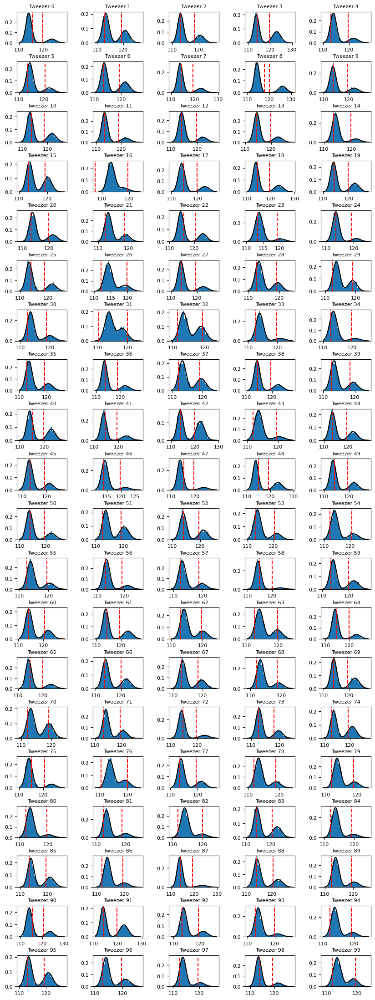

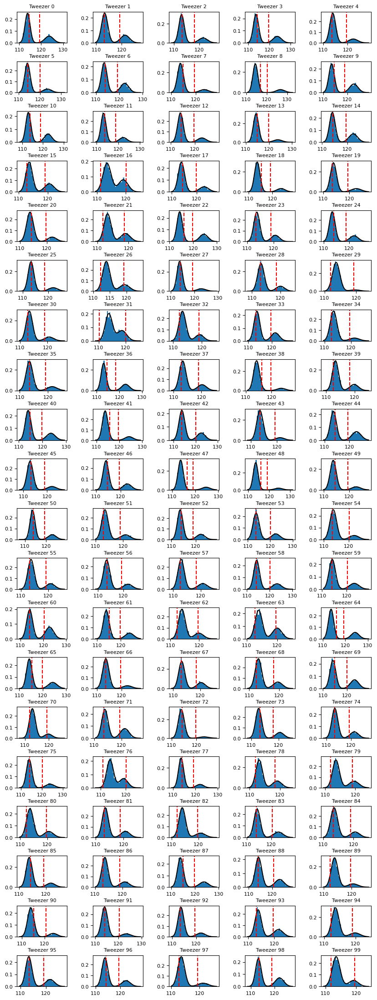

In [6]:
analysis.train_model(path, path + 'model.h5')

48750/48750 [==============================] - 112s 2ms/step


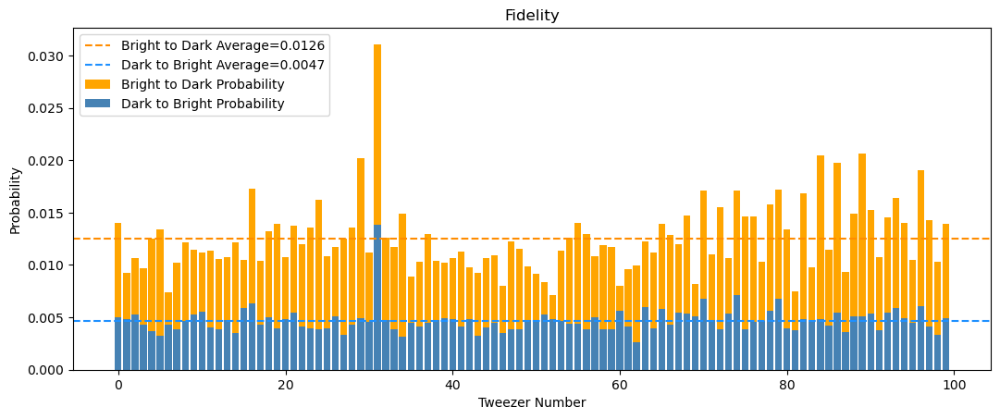

(array([0.004991  , 0.00479345, 0.00523932, 0.00432366, 0.00366417,
        0.00319938, 0.00432861, 0.00387956, 0.00465039, 0.00527727,
        0.00549652, 0.00403624, 0.00389963, 0.00474465, 0.00350709,
        0.0059106 , 0.00629419, 0.00434375, 0.0050337 , 0.00392377,
        0.00479178, 0.00549309, 0.00411489, 0.00397804, 0.00382514,
        0.00392583, 0.00513043, 0.00334526, 0.00426834, 0.00488221,
        0.00459966, 0.01384335, 0.00475301, 0.00386386, 0.00317436,
        0.00446844, 0.00415395, 0.00451115, 0.00471027, 0.00492787,
        0.00480811, 0.00412303, 0.00481749, 0.00321888, 0.00402651,
        0.00446544, 0.00354212, 0.00387503, 0.00385449, 0.00476802,
        0.00454628, 0.00531115, 0.00479985, 0.00462301, 0.00438169,
        0.00434851, 0.00390034, 0.00498731, 0.00389847, 0.00386609,
        0.00561254, 0.00416233, 0.00264098, 0.00595507, 0.00391438,
        0.00581191, 0.00427984, 0.00542415, 0.0053409 , 0.00510783,
        0.00681034, 0.00476863, 0.00388591, 0.00

In [7]:
analysis.fidelity_analysis(path)

Epoch 1/8
66226/66226 [==============================] - 450s 7ms/step - loss: 0.0078 - binary_accuracy: 0.9979 - val_loss: 0.0238 - val_binary_accuracy: 0.9969
Epoch 2/8
66226/66226 [==============================] - 435s 7ms/step - loss: 0.0038 - binary_accuracy: 0.9991 - val_loss: 0.0217 - val_binary_accuracy: 0.9970
Epoch 3/8
66226/66226 [==============================] - 441s 7ms/step - loss: 0.0037 - binary_accuracy: 0.9992 - val_loss: 0.0250 - val_binary_accuracy: 0.9967
Epoch 4/8
66226/66226 [==============================] - 443s 7ms/step - loss: 0.0036 - binary_accuracy: 0.9992 - val_loss: 0.0252 - val_binary_accuracy: 0.9967
Epoch 5/8
66226/66226 [==============================] - 444s 7ms/step - loss: 0.0035 - binary_accuracy: 0.9992 - val_loss: 0.0232 - val_binary_accuracy: 0.9971
Epoch 6/8
66226/66226 [==============================] - 442s 7ms/step - loss: 0.0034 - binary_accuracy: 0.9992 - val_loss: 0.0228 - val_binary_accuracy: 0.9965
Epoch 7/8
66226/66226 [===========

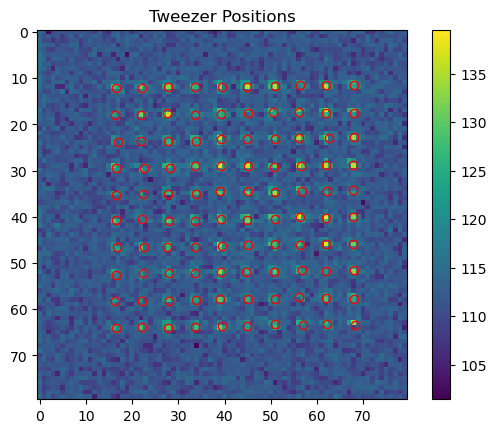

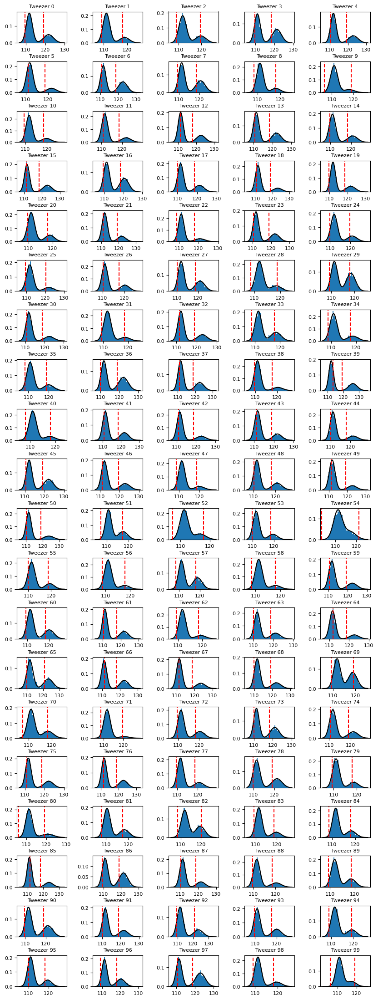

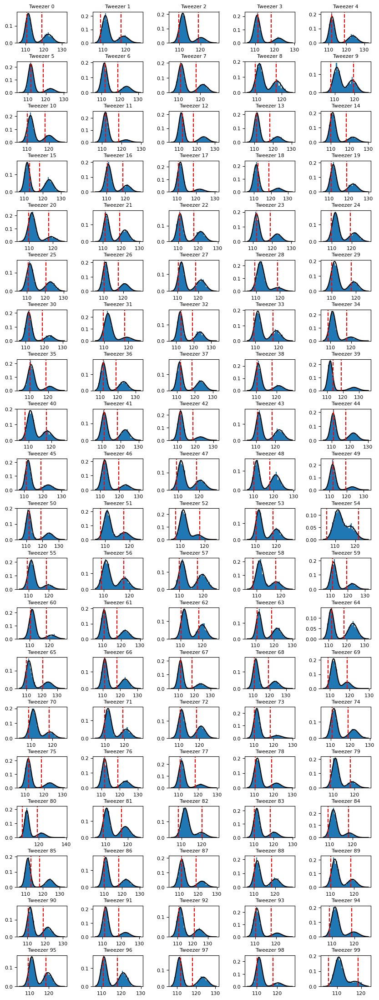

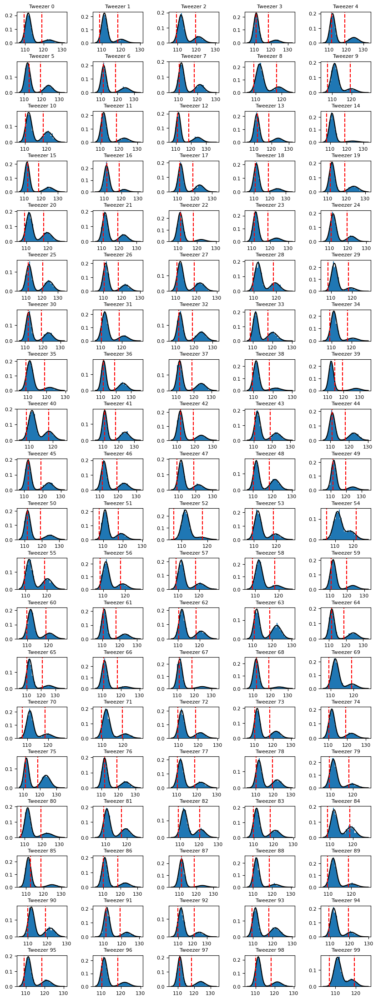

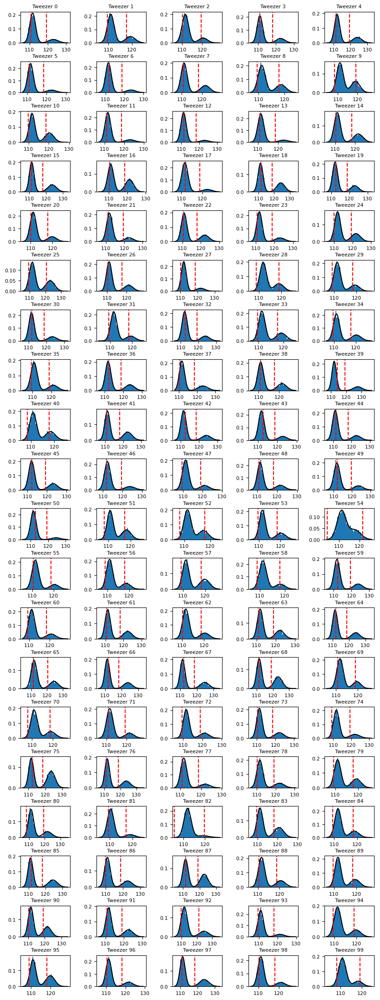

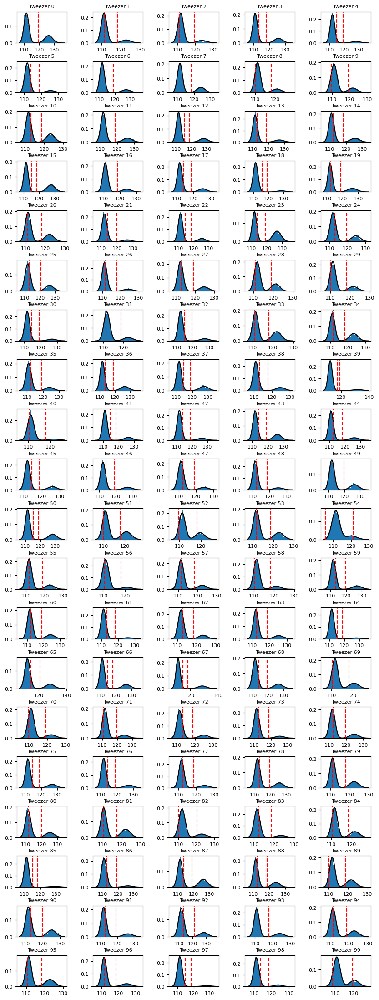

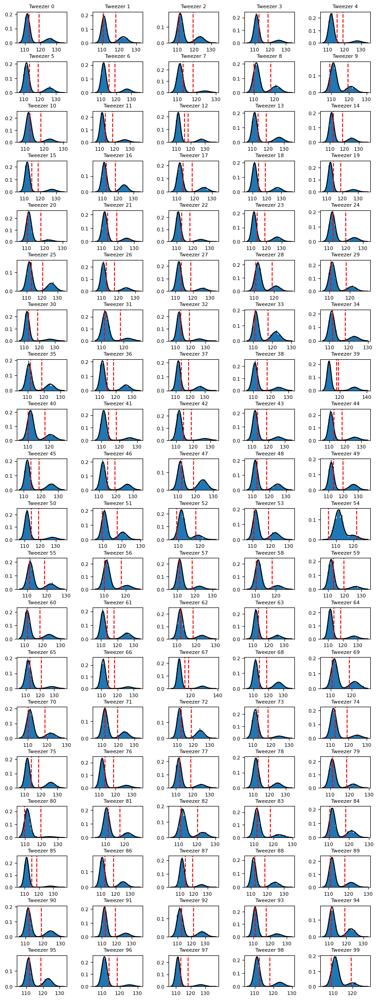

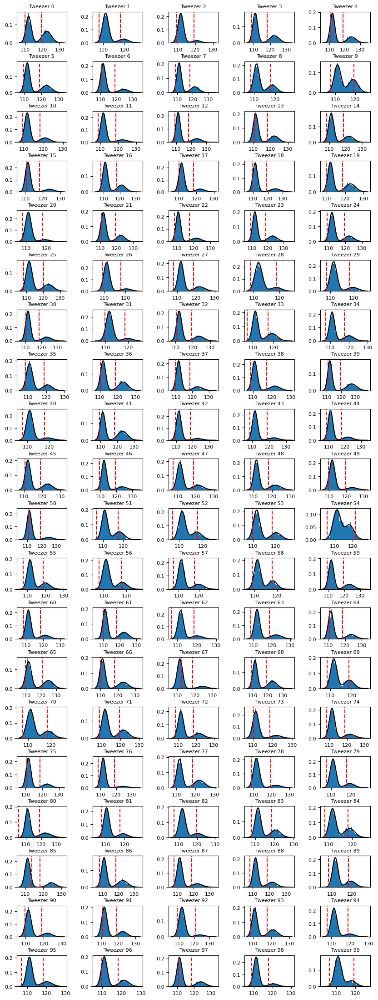

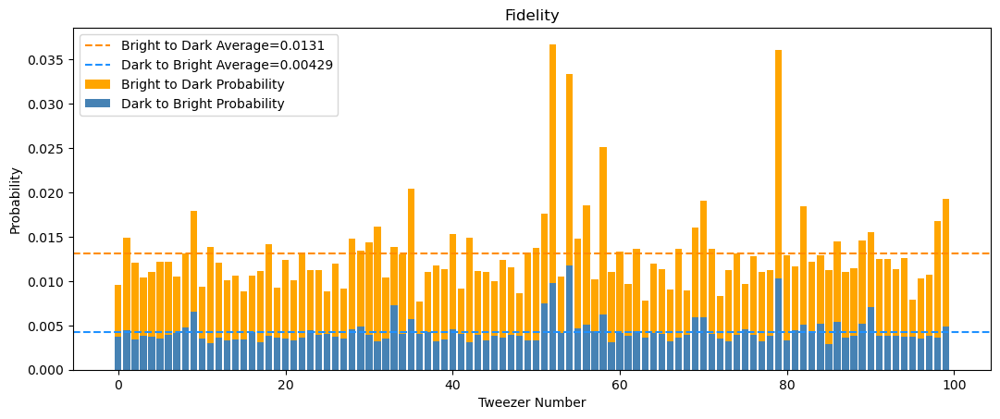

(array([0.0037163 , 0.00443967, 0.00342103, 0.00378425, 0.00368673,
        0.00355564, 0.00389354, 0.00412511, 0.00479421, 0.00658782,
        0.00347276, 0.00303072, 0.00362774, 0.0032599 , 0.00344437,
        0.00343875, 0.00420477, 0.00314046, 0.00387041, 0.00365904,
        0.00352249, 0.00332325, 0.00360977, 0.00448173, 0.00398936,
        0.00401585, 0.00378025, 0.00351185, 0.0045522 , 0.00491375,
        0.00394881, 0.0032392 , 0.00349615, 0.00723111, 0.00403345,
        0.00566531, 0.00408208, 0.00430163, 0.00318638, 0.0033696 ,
        0.00458313, 0.0040935 , 0.00305573, 0.00392947, 0.00327789,
        0.00384096, 0.00366461, 0.0039502 , 0.00383366, 0.00329195,
        0.003287  , 0.00751148, 0.00975728, 0.0041277 , 0.01181426,
        0.00471815, 0.00513566, 0.00433248, 0.00628093, 0.00308642,
        0.00411382, 0.00378317, 0.00432578, 0.00363442, 0.00411192,
        0.0040874 , 0.0032    , 0.00360943, 0.00390686, 0.00592762,
        0.00597236, 0.00404168, 0.00347619, 0.00

In [8]:
path = "/Users/jackmango/Desktop/QUIRP - Work/Princeton/Data/06:23:23/imaging exposure time = 25ms/"
model = architecture_1((17, 17), [16, 8], [3, 3])
model.compile(optimizer=optimizers.Adam(learning_rate=1e-4), loss='binary_crossentropy',
               metrics=['binary_accuracy'])
model.save(path + 'model.h5')
analysis = greenMLAnalysis(n_tweezers, n_loops)
analysis.train_model(path, path + 'model.h5')
analysis.fidelity_analysis(path)

All brightness values for tweezer 74 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 69 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 99 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 48 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 48 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 36 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 74 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 89 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 48 are above the lower threshold!
No i

Epoch 1/8
56029/56029 [==============================] - 4267s 76ms/step - loss: 0.0253 - binary_accuracy: 0.9938 - val_loss: 0.0479 - val_binary_accuracy: 0.9889
Epoch 2/8
56029/56029 [==============================] - 5838s 104ms/step - loss: 0.0179 - binary_accuracy: 0.9957 - val_loss: 0.0426 - val_binary_accuracy: 0.9901
Epoch 3/8
56029/56029 [==============================] - 16095s 287ms/step - loss: 0.0169 - binary_accuracy: 0.9960 - val_loss: 0.0425 - val_binary_accuracy: 0.9894
Epoch 4/8
56029/56029 [==============================] - 407s 7ms/step - loss: 0.0162 - binary_accuracy: 0.9961 - val_loss: 0.0422 - val_binary_accuracy: 0.9893
Epoch 5/8
56029/56029 [==============================] - 429s 8ms/step - loss: 0.0158 - binary_accuracy: 0.9961 - val_loss: 0.0397 - val_binary_accuracy: 0.9905
Epoch 6/8
56029/56029 [==============================] - 417s 7ms/step - loss: 0.0156 - binary_accuracy: 0.9962 - val_loss: 0.0411 - val_binary_accuracy: 0.9901
Epoch 7/8
56029/56029 [==

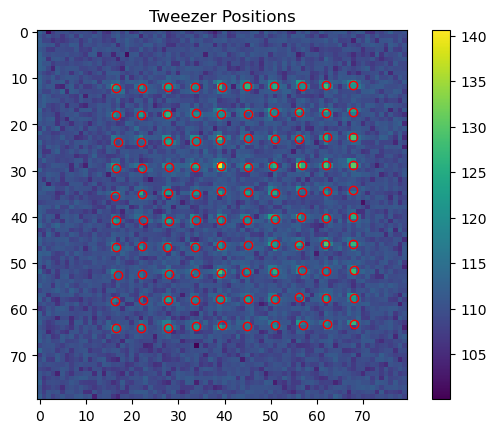

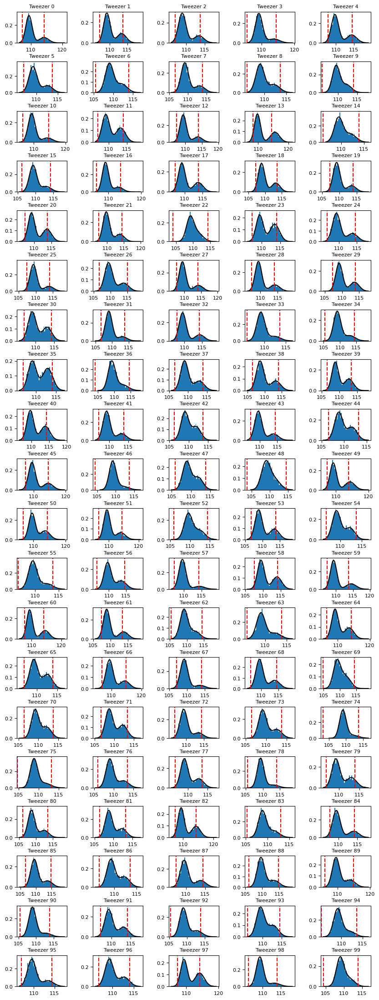

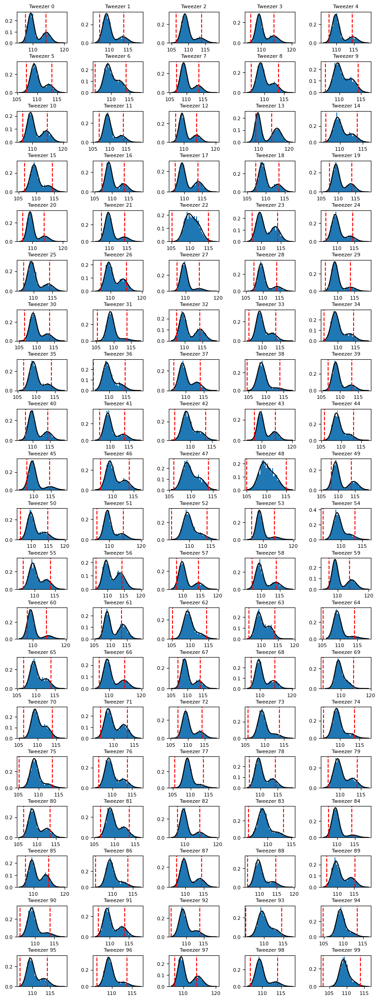

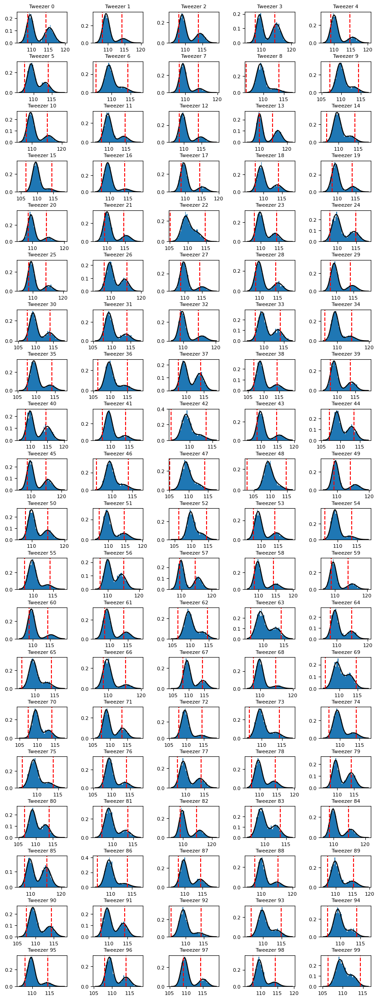

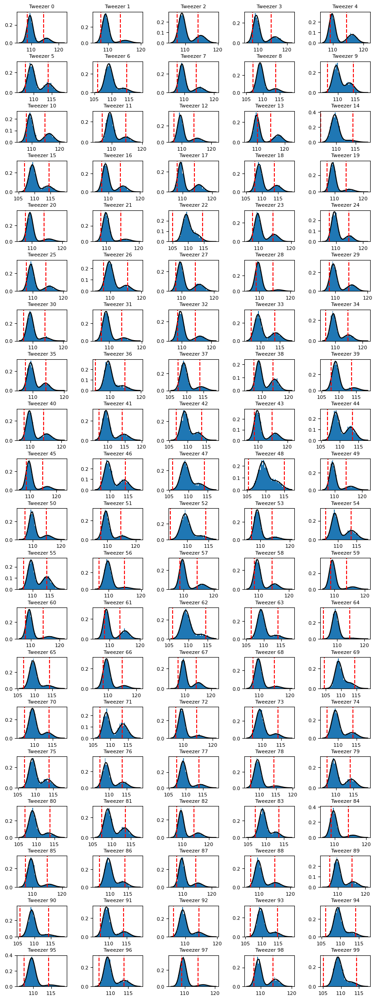

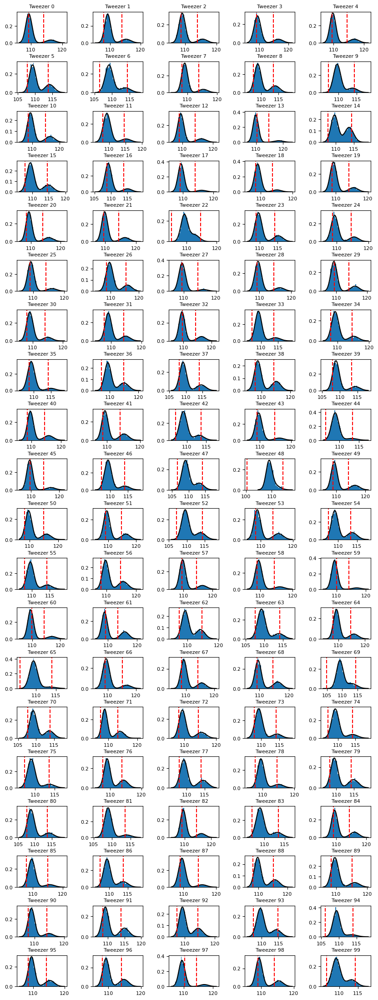

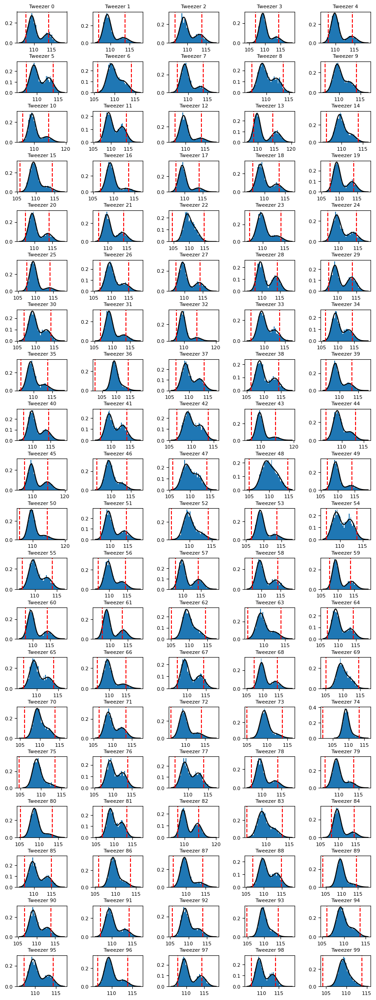

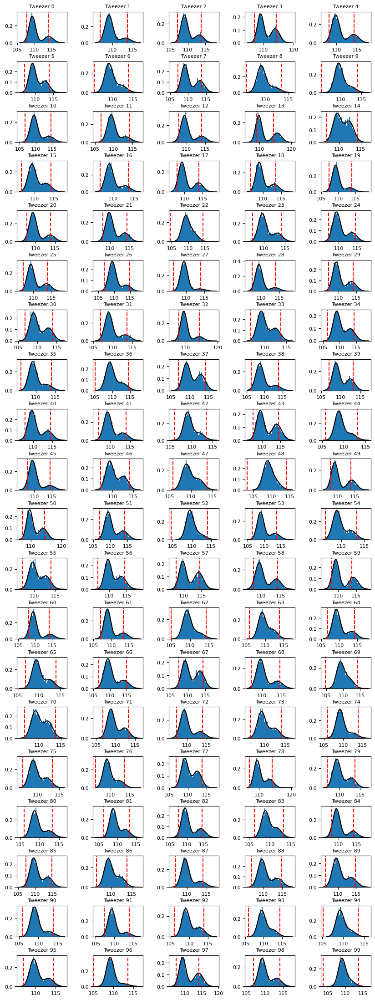

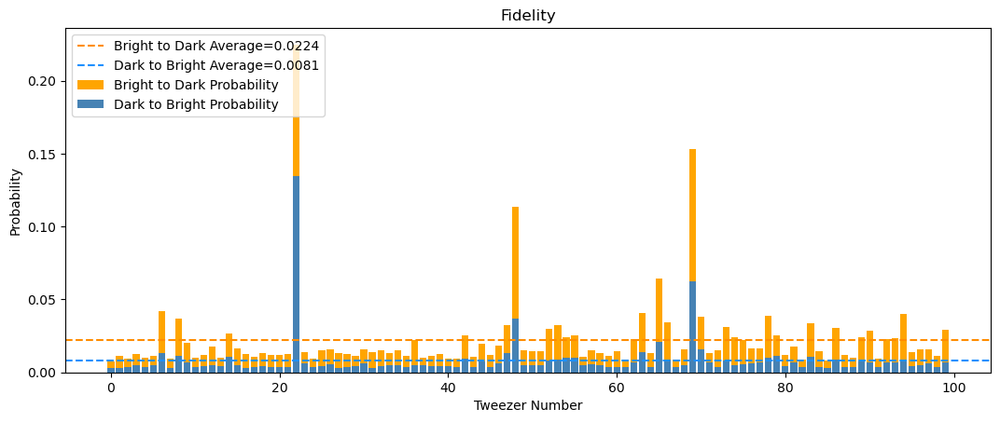

(array([0.00285934, 0.00308329, 0.00351083, 0.00516484, 0.00365661,
        0.00521747, 0.0129143 , 0.00291097, 0.01120026, 0.00689108,
        0.00386775, 0.00419798, 0.0049556 , 0.00456496, 0.01091292,
        0.00489689, 0.00315227, 0.00356835, 0.00433669, 0.00360782,
        0.00367915, 0.00397096, 0.13434486, 0.00609073, 0.00353283,
        0.00416241, 0.00587234, 0.00320562, 0.00358009, 0.00450103,
        0.00605228, 0.00327021, 0.0043206 , 0.00511814, 0.00496085,
        0.00382763, 0.00518195, 0.00480355, 0.0042155 , 0.00455686,
        0.00425971, 0.00344625, 0.00952503, 0.00354206, 0.0075146 ,
        0.00350628, 0.00591303, 0.01305221, 0.03687654, 0.00522496,
        0.00491878, 0.00480085, 0.0078251 , 0.0086241 , 0.00996576,
        0.00985351, 0.00481917, 0.0055475 , 0.00487518, 0.0037318 ,
        0.00337475, 0.00364115, 0.00655188, 0.01388539, 0.00369517,
        0.02083074, 0.00890336, 0.00393888, 0.00484213, 0.0624917 ,
        0.01573203, 0.00714861, 0.00379978, 0.00

In [9]:
path = "/Users/jackmango/Desktop/QUIRP - Work/Princeton/Data/06:23:23/imaging exposure time = 20ms/"
model = architecture_1((17, 17), [16, 8], [3, 3])
model.compile(optimizer=optimizers.Adam(learning_rate=1e-4), loss='binary_crossentropy',
               metrics=['binary_accuracy'])
model.save(path + 'model.h5')
analysis = greenMLAnalysis(n_tweezers, n_loops)
analysis.train_model(path, path + 'model.h5')
analysis.fidelity_analysis(path)

All brightness values for tweezer 41 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 94 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 6 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 23 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 26 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 55 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 73 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 74 are above the lower threshold!
No images for this tweezer can be labeled dark!
All brightness values for tweezer 86 are above the lower threshold!
No im

Epoch 1/8
47937/47937 [==============================] - 331s 7ms/step - loss: 0.0713 - binary_accuracy: 0.9784 - val_loss: 0.0654 - val_binary_accuracy: 0.9823
Epoch 2/8
47937/47937 [==============================] - 336s 7ms/step - loss: 0.0542 - binary_accuracy: 0.9840 - val_loss: 0.0669 - val_binary_accuracy: 0.9819
Epoch 3/8
47937/47937 [==============================] - 351s 7ms/step - loss: 0.0513 - binary_accuracy: 0.9847 - val_loss: 0.0664 - val_binary_accuracy: 0.9818
Epoch 4/8
47937/47937 [==============================] - 344s 7ms/step - loss: 0.0498 - binary_accuracy: 0.9852 - val_loss: 0.0622 - val_binary_accuracy: 0.9830
Epoch 5/8
47937/47937 [==============================] - 349s 7ms/step - loss: 0.0488 - binary_accuracy: 0.9854 - val_loss: 0.0603 - val_binary_accuracy: 0.9835
Epoch 6/8
47937/47937 [==============================] - 334s 7ms/step - loss: 0.0483 - binary_accuracy: 0.9855 - val_loss: 0.0606 - val_binary_accuracy: 0.9834
Epoch 7/8
47937/47937 [===========

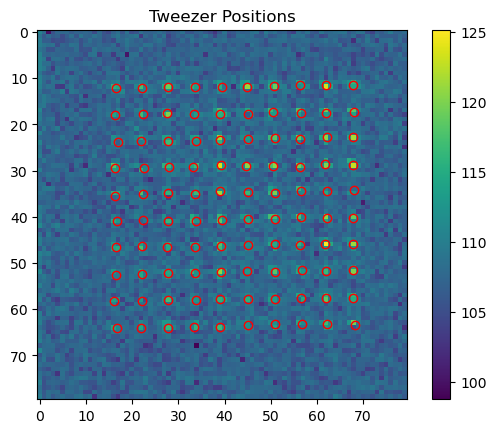

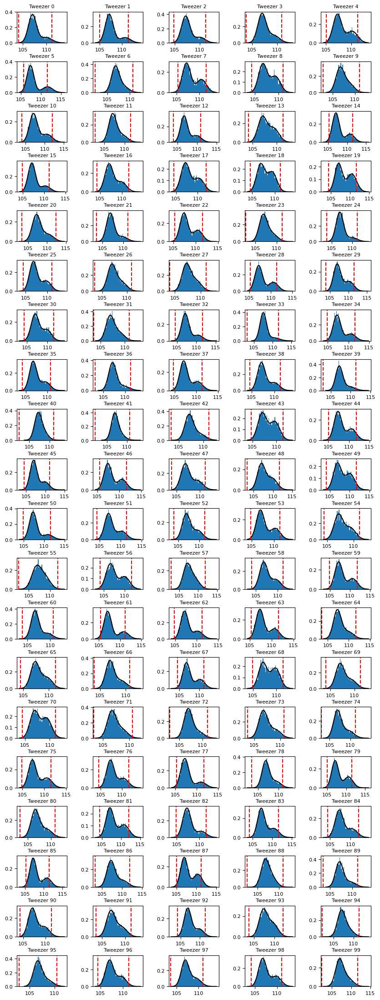

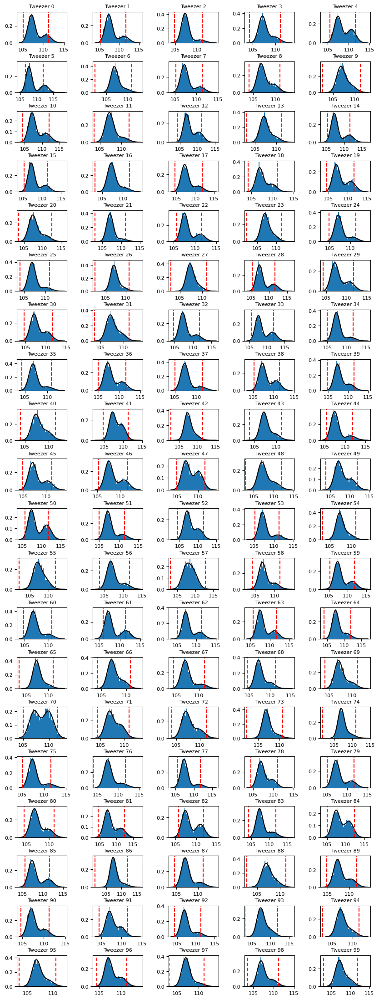

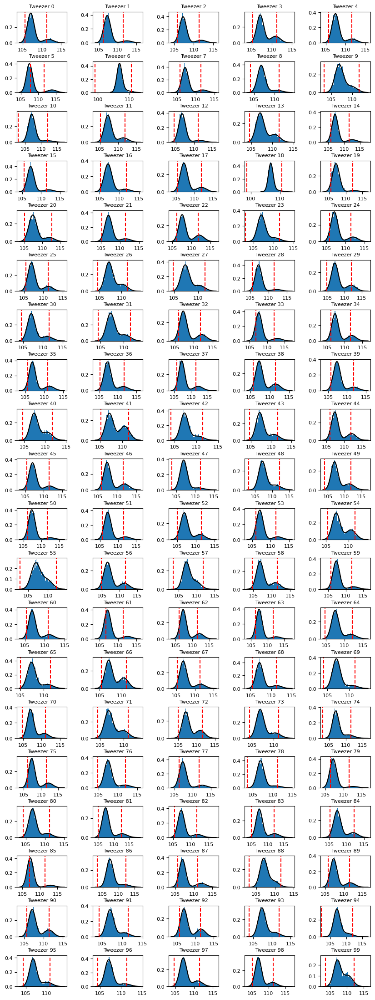

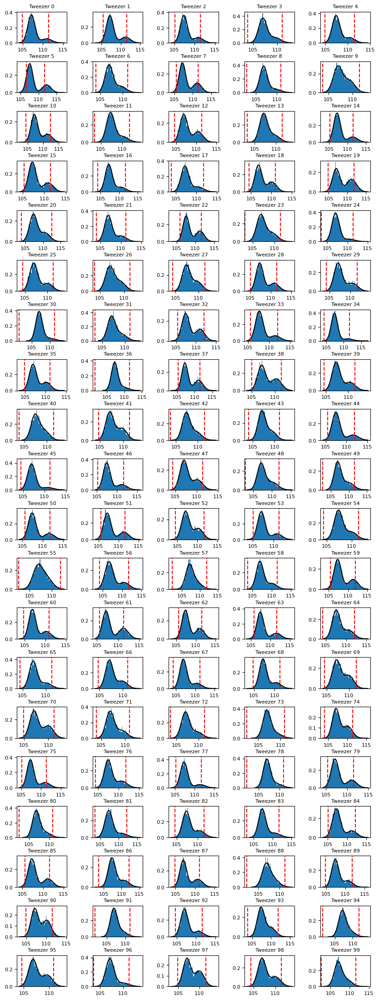

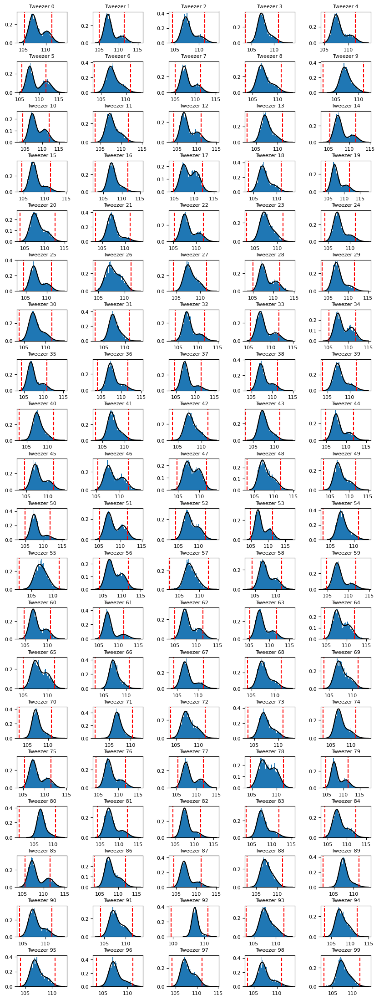

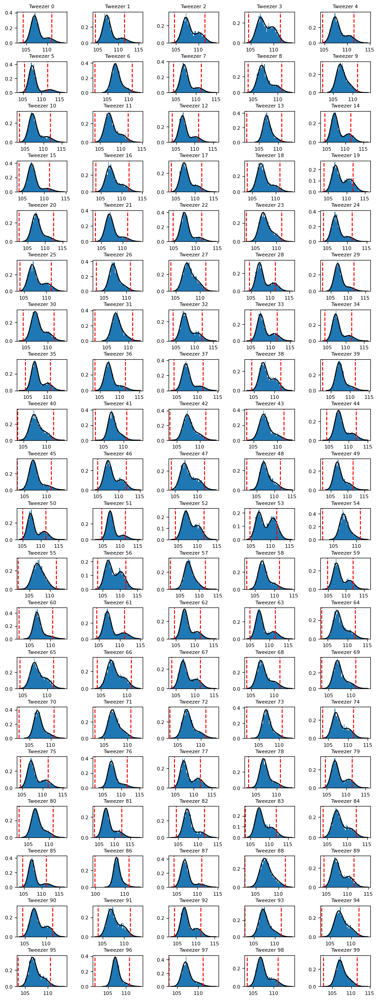

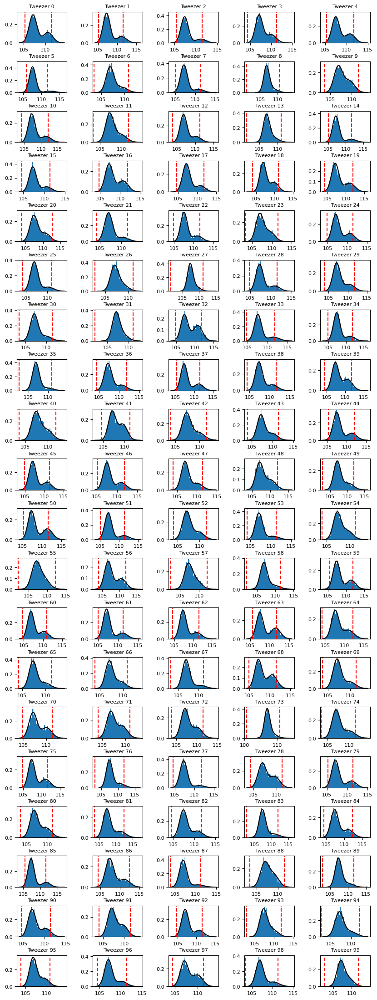

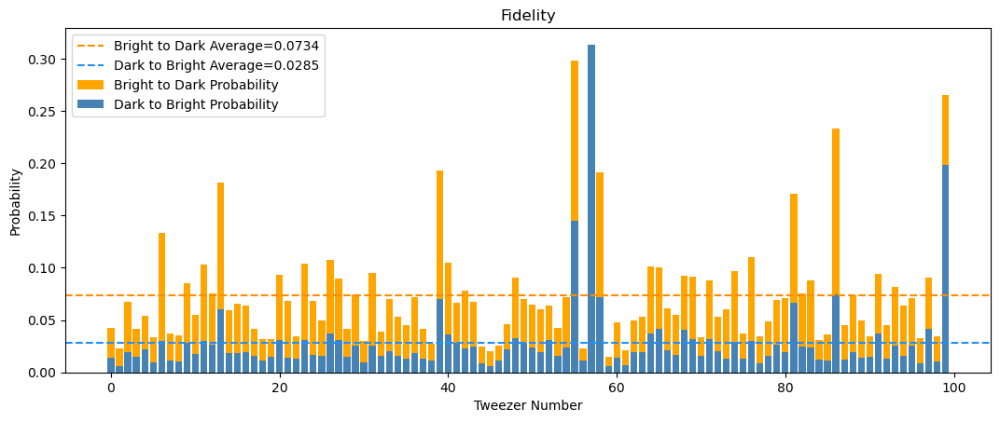

(array([0.01400461, 0.00612599, 0.01930863, 0.01530562, 0.02241203,
        0.00968296, 0.03011941, 0.01164673, 0.01008539, 0.02844398,
        0.01788754, 0.03010672, 0.02665838, 0.05997738, 0.01838108,
        0.01804553, 0.01901534, 0.01570278, 0.01171578, 0.01510574,
        0.03098146, 0.01370181, 0.01337266, 0.03075475, 0.01685919,
        0.01585327, 0.03750736, 0.03103077, 0.01481019, 0.02536373,
        0.00932342, 0.02542451, 0.01559322, 0.01991364, 0.01559472,
        0.01284318, 0.01805185, 0.01311611, 0.01129693, 0.07014293,
        0.03667201, 0.02827135, 0.0232361 , 0.02475855, 0.00858037,
        0.00586181, 0.01147513, 0.02195531, 0.03246732, 0.02835796,
        0.02347743, 0.0197781 , 0.03075489, 0.01600053, 0.02366159,
        0.14517818, 0.01093999, 0.31356935, 0.07184809, 0.00572105,
        0.01383609, 0.00665647, 0.01910124, 0.01936166, 0.03710446,
        0.04135944, 0.0207232 , 0.01635602, 0.04109781, 0.03218722,
        0.01598027, 0.0314971 , 0.01987173, 0.01

In [11]:
path = "/Users/jackmango/Desktop/QUIRP - Work/Princeton/Data/06:23:23/imaging exposure time = 15ms/"
model = architecture_1((17, 17), [16, 8], [3, 3])
model.compile(optimizer=optimizers.Adam(learning_rate=1e-4), loss='binary_crossentropy',
               metrics=['binary_accuracy'])
model.save(path + 'model.h5')
analysis = greenMLAnalysis(n_tweezers, n_loops)
analysis.train_model(path, path + 'model.h5')
analysis.fidelity_analysis(path)

In [30]:
ml_bd = [0.0677, 0.0224, 0.0131, 0.0126]
ml_db = [0.0257, 0.0081, 0.00429, 0.0047]

thresh_bd = [0.0759, 0.04564, 0.02765, 0.01701]
thresh_db = [0.02384, 0.01291, 0.00572, 0.00156]

times = [15, 20, 25, 30]

Text(0.5, 1.0, 'Dark to Bright Probability\nAveraged Across All Tweezers')

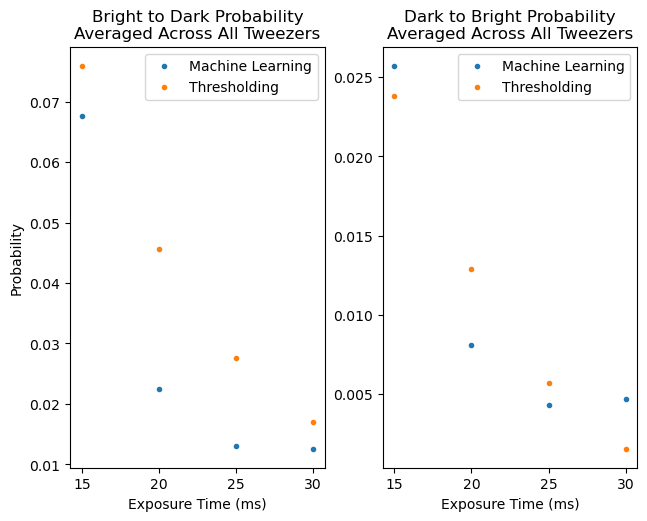

In [31]:
fig, axs = plt.subplots(1, 2)
fig.tight_layout()
axs[0].plot(times, ml_bd, '.', label="Machine Learning")
axs[0].plot(times, thresh_bd, '.', label="Thresholding")
axs[0].legend()
axs[0].set_xlabel("Exposure Time (ms)")
axs[0].set_ylabel("Probability")
axs[0].set_title("Bright to Dark Probability\nAveraged Across All Tweezers")

axs[1].plot(times, ml_db, '.', label="Machine Learning")
axs[1].plot(times, thresh_db, '.', label="Thresholding")
axs[1].legend()
axs[1].set_xlabel("Exposure Time (ms)")
axs[1].set_title("Dark to Bright Probability\nAveraged Across All Tweezers")